
# Chinese Restaurants Neighbourhoods of London

## Introduction

This is the final project of the IBM Data Science Course on Coursera. In this project, I have analyzed the scenario of Chinese Restaurants in London. The results and data obtained mighb be used such as information for tourisms guides, neighbourhoods where it is possible to create a new chinese restaurant or areas to avoid in the city for this news Chinese restaurants. Whit these ideas in mind, I have developed this project to get the correct information for tourists or the best locations for new restaurant. The project will be developed with python, Foursquare API and all tools and mechanism that I have learned in this IBM Course.

## Business problem

The aim of this project is to help to find the best location for any person that wants establish his Chinese Restaurant in London. In addition, this project can help to ellaborate a tourist guide with the better information about Chinese Restaurants in the capital of United Kingdom.

## Data

It is necessary data about the boroughs(or Neighbourhoods), geolocation data of each borough and all the venues in each borough visited by the people in London. When we have obtained this information will be relevant the correct union of valid information in order to cluster the Neighbourhoods and obtain valuables results. We are going to use the following apps or websites pages in order to obtain the primary information:

1. Wikipedia
2. Foursquare API
3. ArcGIS geolocations

### Wikipedia

To obtain the data of London's Borough, we have to scrape data from:
https://en.wikipedia.org/wiki/List_of_areas_of_London

On this website we will obtain: Borough, Town and Postal code after clean the dataframes.

### Foursquare API

We need credentials in order to obtain the information, so first of all we have to register in Foursquare Developer API https://foursquare.com/

All the information about venues location in London will be provided by Foursquare API. This information will be the cornerstone to elaborate this project.

On this website we will obtain: Neighbourhoods, latitude, longitude, venues and venues category.

### ArcGIS geolocations

Arcgis is a System of Geographic Information (GIS) that provide to the project the coordinates of each neighbourhood and the city of London in order to obtain the maps and make the cluster with Folium.

### Import libraries

Import the python libraries on python

In [1]:
import pandas as pd
import numpy as np
import requests
import matplotlib.pyplot as plt
%matplotlib inline

### Scrapping the wikipedia data

The next codes cell will be in ordert to get the dataframe from wikipedia about London Boroughs

In [4]:
wiki_url = "https://en.wikipedia.org/wiki/List_of_areas_of_London"
wiki_page = requests.get(wiki_url)
wiki_data = pd.read_html(wiki_page.text)
wiki_data

[                                                   0
 0  Map all coordinates in "Category:Areas of Lond...
 1                 Download coordinates as: KML · GPX,
             Location                     London borough       Post town  \
 0         Abbey Wood              Bexley, Greenwich [7]          LONDON   
 1              Acton  Ealing, Hammersmith and Fulham[8]          LONDON   
 2          Addington                         Croydon[8]         CROYDON   
 3         Addiscombe                         Croydon[8]         CROYDON   
 4        Albany Park                             Bexley  BEXLEY, SIDCUP   
 ..               ...                                ...             ...   
 526         Woolwich                          Greenwich          LONDON   
 527   Worcester Park       Sutton, Kingston upon Thames  WORCESTER PARK   
 528  Wormwood Scrubs             Hammersmith and Fulham          LONDON   
 529          Yeading                         Hillingdon           HAYES   
 

In [5]:
len(wiki_data)

5

In [6]:
type(wiki_data)

list

### Cleanning dataframe and renaming the columns

In [7]:
wiki_df = wiki_data[1]
wiki_df.head()
wiki_df

,Location,London borough,Post town,Postcode district,Dial code,OS grid ref
0,Abbey Wood,"Bexley, Greenwich [7]",LONDON,SE2,020,TQ465785
1,Acton,"Ealing, Hammersmith and Fulham[8]",LONDON,"W3, W4",020,TQ205805
2,Addington,Croydon[8],CROYDON,CR0,020,TQ375645
3,Addiscombe,Croydon[8],CROYDON,CR0,020,TQ345665
4,Albany Park,Bexley,"BEXLEY, SIDCUP","DA5, DA14",020,TQ478728
...,...,...,...,...,...,...
526,Woolwich,Greenwich,LONDON,SE18,020,TQ435795
527,Worcester Park,"Sutton, Kingston upon Thames",WORCESTER PARK,KT4,020,TQ225655
528,Wormwood Scrubs,Hammersmith and Fulham,LONDON,W12,020,TQ225815
529,Yeading,Hillingdon,HAYES,UB4,020,TQ115825


In [8]:
df = wiki_df.drop( [ wiki_df.columns[0], wiki_df.columns[4], wiki_df.columns[5] ], axis=1)
df

,London borough,Post town,Postcode district
0,"Bexley, Greenwich [7]",LONDON,SE2
1,"Ealing, Hammersmith and Fulham[8]",LONDON,"W3, W4"
2,Croydon[8],CROYDON,CR0
3,Croydon[8],CROYDON,CR0
4,Bexley,"BEXLEY, SIDCUP","DA5, DA14"
...,...,...,...
526,Greenwich,LONDON,SE18
527,"Sutton, Kingston upon Thames",WORCESTER PARK,KT4
528,Hammersmith and Fulham,LONDON,W12
529,Hillingdon,HAYES,UB4


In [9]:
df.columns = ['Borough','Town','Post-code']
list(df.columns.values)

['Borough', 'Town', 'Post-code']

In [10]:
df

,Borough,Town,Post-code
0,"Bexley, Greenwich [7]",LONDON,SE2
1,"Ealing, Hammersmith and Fulham[8]",LONDON,"W3, W4"
2,Croydon[8],CROYDON,CR0
3,Croydon[8],CROYDON,CR0
4,Bexley,"BEXLEY, SIDCUP","DA5, DA14"
...,...,...,...
526,Greenwich,LONDON,SE18
527,"Sutton, Kingston upon Thames",WORCESTER PARK,KT4
528,Hammersmith and Fulham,LONDON,W12
529,Hillingdon,HAYES,UB4


In [11]:
df['Borough'] = df['Borough'].map(lambda x: x.rstrip(']').rstrip('0123456789').rstrip('['))
df


,Borough,Town,Post-code
0,"Bexley, Greenwich",LONDON,SE2
1,"Ealing, Hammersmith and Fulham",LONDON,"W3, W4"
2,Croydon,CROYDON,CR0
3,Croydon,CROYDON,CR0
4,Bexley,"BEXLEY, SIDCUP","DA5, DA14"
...,...,...,...
526,Greenwich,LONDON,SE18
527,"Sutton, Kingston upon Thames",WORCESTER PARK,KT4
528,Hammersmith and Fulham,LONDON,W12
529,Hillingdon,HAYES,UB4


### Obtain the shape and info dataframe

In [12]:
df.shape

(531, 3)

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 531 entries, 0 to 530
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Borough    531 non-null    object
 1   Town       531 non-null    object
 2   Post-code  531 non-null    object
dtypes: object(3)
memory usage: 12.6+ KB


### Install arcgis and obtain the coords

In [118]:
!pip install arcgis

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 2.6 MB 2.7 MB/s eta 0:00:01
  Using cached keyring-21.8.0-py3-none-any.whl (32 kB)
  Using cached jeepney-0.6.0-py3-none-any.whl (45 kB)
  Using cached pyshp-2.1.3-py3-none-any.whl
  Using cached SecretStorage-3.3.0-py3-none-any.whl (14 kB)
  Using cached ujson-4.0.1-cp38-cp38-manylinux1_x86_64.whl (181 kB)
  Using cached jupyterlab-3.0.5-py3-none-any.whl (8.3 MB)
  Using cached jupyter_server-1.2.2-py3-none-any.whl (184 kB)
  Using cached anyio-2.0.2-py3-none-any.whl (62 kB)
  Using cached jupyterlab_server-2.1.2-py3-none-any.whl (47 kB)
  Using cached nbclassic-0.2.6-py3-none-any.whl (18 kB)
  Using cached sniffio-1.2.0-py3-none-any.whl (10 kB)
  Using cached tornado-6.1-cp38-cp38-manylinux2010_x86_64.whl (427 kB)
  Using cached Babel-2.9.0-py2.py3-none-any.whl (8.8 MB)
  Using cached json5-0.9.5-py2.py3-none-any.whl (17 kB)
  Using cached lerc-0.1.0-py3-none-any.whl


In [14]:
from arcgis.geocoding import geocode
from arcgis.gis import GIS
gis = GIS()

In [15]:
def get_x_y_london(address):
    lat_coords = 0
    long_coords = 0
    g = geocode(address='{}, London, England, GBR'.format(address))[0]
    long_coords = g['location']['x']
    lat_coords = g['location']['y']
    return str(lat_coords) +","+ str(long_coords)

### Check the shapes and types of the two dataframes 

In [16]:
post_code_london = df['Post-code']    
post_code_london

0            SE2
1         W3, W4
2            CR0
3            CR0
4      DA5, DA14
         ...    
526         SE18
527          KT4
528          W12
529          UB4
530          UB7
Name: Post-code, Length: 531, dtype: object

In [17]:
coordinates_london = post_code_london.apply(lambda x: get_x_y_london(x))
coordinates_london

0      51.492450000000076,0.12127000000003818
1       51.51324000000005,-0.2674599999999714
2      51.38475500000004,-0.05149847299992416
3      51.38475500000004,-0.05149847299992416
4       51.50642000000005,-0.1272099999999341
                        ...                  
526     51.48207000000008,0.07143000000002075
527     51.50642000000005,-0.1272099999999341
528     51.50645000000003,-0.2369099999999662
529     51.50642000000005,-0.1272099999999341
530     51.50642000000005,-0.1272099999999341
Name: Post-code, Length: 531, dtype: object

In [18]:
lat_uk = coordinates_london.apply(lambda x: x.split(',')[0])
long_uk = coordinates_london.apply(lambda x: x.split(',')[1])

### Concat the two dataframes (wikipedia dataframe and arcgis dataframe)

In [19]:
london_merged = pd.concat([df,lat_uk.astype(float), long_uk.astype(float)], axis=1)
london_merged.columns= ['Borough','Town','Post-code','Latitude','Longitude']
london_merged

,Borough,Town,Post-code,Latitude,Longitude
0,"Bexley, Greenwich",LONDON,SE2,51.492450,0.121270
1,"Ealing, Hammersmith and Fulham",LONDON,"W3, W4",51.513240,-0.267460
2,Croydon,CROYDON,CR0,51.384755,-0.051498
3,Croydon,CROYDON,CR0,51.384755,-0.051498
4,Bexley,"BEXLEY, SIDCUP","DA5, DA14",51.506420,-0.127210
...,...,...,...,...,...
526,Greenwich,LONDON,SE18,51.482070,0.071430
527,"Sutton, Kingston upon Thames",WORCESTER PARK,KT4,51.506420,-0.127210
528,Hammersmith and Fulham,LONDON,W12,51.506450,-0.236910
529,Hillingdon,HAYES,UB4,51.506420,-0.127210


In [20]:
london_merged.dtypes

Borough       object
Town          object
Post-code     object
Latitude     float64
Longitude    float64
dtype: object

In [21]:
london_merged.shape

(531, 5)

### Obtaining the coords of London city

In [22]:
london = geocode(address = 'London, England, GBR')[0]
london

{'address': 'London, England',
 'location': {'x': -0.1272099999999341, 'y': 51.50642000000005},
 'score': 100,
 'attributes': {'Loc_name': 'World',
  'Status': 'T',
  'Score': 100,
  'Match_addr': 'London, England',
  'LongLabel': 'London, England, GBR',
  'ShortLabel': 'London',
  'Addr_type': 'Locality',
  'Type': 'City',
  'PlaceName': 'London',
  'Place_addr': 'London, England',
  'Phone': '',
  'URL': '',
  'Rank': 1.75,
  'AddBldg': '',
  'AddNum': '',
  'AddNumFrom': '',
  'AddNumTo': '',
  'AddRange': '',
  'Side': '',
  'StPreDir': '',
  'StPreType': '',
  'StName': '',
  'StType': '',
  'StDir': '',
  'BldgType': '',
  'BldgName': '',
  'LevelType': '',
  'LevelName': '',
  'UnitType': '',
  'UnitName': '',
  'SubAddr': '',
  'StAddr': '',
  'Block': '',
  'Sector': '',
  'Nbrhd': '',
  'District': '',
  'City': 'London',
  'MetroArea': '',
  'Subregion': 'London',
  'Region': 'England',
  'RegionAbbr': 'ENG',
  'Territory': '',
  'Zone': '',
  'Postal': '',
  'PostalExt': ''

In [23]:
london_long_coords = london['location']['x']
london_lat_coords = london['location']['y']
print('The coordinates of London are {}, {}.'.format(london_lat_coords, london_long_coords))

The coordinates of London are 51.50642000000005, -0.1272099999999341.


### Create and visualize London's map with Folium

In [24]:
import folium

In [25]:
map_London = folium.Map(location=[london_lat_coords, london_long_coords], zoom_start=11)

### Adding markers neighbourhoods to map

In [26]:
for latitude, longitude, borough, town in zip(london_merged['Latitude'], london_merged['Longitude'], london_merged['Borough'], london_merged['Town']):
    label = '{}, {}'.format(town, borough)
    label = folium.Popup(label, parse_html = True)
    folium.CircleMarker(
        [latitude, longitude],
        radius = 4,
        popup = label,
        color = 'black',
        fill = True
        ).add_to(map_London)  
    
map_London

### Foursquare API credentials

In [27]:
CLIENT_ID = 'NRGQEDUFGDGDUVYO3MEW3QY1E1P51QHT3QBP0MTNJL12ZZ0F' 
CLIENT_SECRET = '02GVG22AKZW33XAPG3ZUPVX0BZNCH0DKZJUCPMFH54BC3RTB'
VERSION = '20180605' 


### Getting all venues categories in London

In [28]:
Limit=100

def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, long in zip(names, latitudes, longitudes):
        print(name)
            
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            long, 
            radius,
            Limit
            )
            
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        venues_list.append([(
            name, 
            lat, 
            long, 
            v['venue']['name'], 
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([element for venue in venues_list for element in venue])
    nearby_venues.columns = ['Neighbourhood', 
                  'Neighbourhood Latitude', 
                  'Neighbourhood Longitude', 
                  'Venue', 
                  'Venue Category']
    
    return(nearby_venues)

### Venues in London for each Neighbourhood with function created

In [29]:
venues_in_london = getNearbyVenues(london_merged['Borough'], london_merged['Latitude'], london_merged['Longitude'])

Bexley, Greenwich 
Ealing, Hammersmith and Fulham
Croydon
Croydon
Bexley
Redbridge
City
Westminster
Brent
Bromley
Islington
Bromley
Islington
Havering
Barnet
Enfield
Wandsworth
Southwark
City
Barking and Dagenham
Redbridge
Bexley
Richmond upon Thames
Bexley
Barnet
Barnet
Islington
Wandsworth
Westminster
Bromley
Newham
Barking and Dagenham
Barking and Dagenham
Sutton
Ealing
Westminster
Lewisham
Harrow
Sutton
Camden
Bexley
Southwark
Kingston upon Thames
Tower Hamlets
Bexley
Bexley
Bromley
Bromley
Bexley
City
Lewisham
Greenwich
Tower Hamlets
Bexley
Camden
Enfield
Haringey
Tower Hamlets
Haringey
Hounslow
Barnet
Brent
Enfield
Lambeth
Lewisham
Bromley
Tower Hamlets
Bromley
Kensington and Chelsea, Hammersmith and Fulham
Brent
Barnet
Enfield
Barnet
Barnet
Southwark
Tower Hamlets
Camden
Tower Hamlets
Waltham Forest
Newham
Islington
Sutton
Richmond upon Thames
Barking and Dagenham
Lewisham
Redbridge, Barking and Dagenham
Camden
Westminster
Greenwich
Havering
Sutton
Kensington and Chelsea
Bromley

In [30]:
venues_in_london.shape

(21560, 5)

In [31]:
venues_in_london.head()

,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Category
0,"Bexley, Greenwich",51.49245,0.12127,Lesnes Abbey,Historic Site
1,"Bexley, Greenwich",51.49245,0.12127,Sainsbury's,Supermarket
2,"Bexley, Greenwich",51.49245,0.12127,Lidl,Supermarket
3,"Bexley, Greenwich",51.49245,0.12127,Abbey Wood Railway Station (ABW),Train Station
4,"Bexley, Greenwich",51.49245,0.12127,Bean @ Work,Coffee Shop


In [35]:
b = venues_in_london.groupby('Neighbourhood').count()
b.sort_values('Venue')['Venue']

Neighbourhood
Harrow, Brent                                        3
Barnet, Brent, Camden                                5
Bexley, Greenwich                                    5
Ealing, Hammersmith and Fulham                       7
Bexley, Greenwich                                    8
Brent, Ealing                                        8
Lewisham, Southwark                                  8
Greenwich, Lewisham                                  9
Lewisham, Bromley                                   13
Haringey, Islington                                 26
Islington, Camden                                   31
Brent, Camden                                       34
Hounslow, Ealing, Hammersmith and Fulham            40
Lambeth, Southwark                                  41
Camden, Islington                                   41
Haringey, Barnet                                    45
Redbridge, Barking and Dagenham                     66
Sutton, Kingston upon Thames                       

In [40]:
venues_category = venues_in_london['Venue Category'].unique()
venues_category

array(['Historic Site', 'Supermarket', 'Train Station', 'Coffee Shop',
       'Grocery Store', 'Bed & Breakfast', 'Indian Restaurant', 'Park',
       'Breakfast Spot', 'Hotel', 'Plaza', 'Fountain',
       'Outdoor Sculpture', 'Monument / Landmark', 'Art Museum', 'Church',
       'Garden', 'Art Gallery', 'Wine Bar', 'Indie Movie Theater',
       'Thai Restaurant', 'Burger Joint', 'Theater', 'Opera House',
       'Gay Bar', 'Ice Cream Shop', 'Boutique', 'Cocktail Bar',
       'Pharmacy', 'Japanese Restaurant', 'Bar', 'Liquor Store', 'Spa',
       'Sandwich Place', 'Mexican Restaurant', 'Tea Room', 'Bakery',
       'Tour Provider', 'Greek Restaurant', 'Pakistani Restaurant',
       'English Restaurant', 'Steakhouse', 'French Restaurant', 'Lounge',
       'Restaurant', 'Ramen Restaurant', 'Lebanese Restaurant', 'Café',
       'Italian Restaurant', 'Pub', 'Sculpture Garden', 'Scenic Lookout',
       'Salad Place', 'Market', 'Mini Golf', 'Beer Bar',
       'Portuguese Restaurant', 'South Ame

### Grouping data by categories

In [46]:
Gb_venues_category = venues_in_london.groupby('Venue Category').count()
Gb_venues_category



,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue
Venue Category,,,,
Accessories Store,4,4,4,4
Adult Boutique,7,7,7,7
African Restaurant,6,6,6,6
American Restaurant,19,19,19,19
Antique Shop,7,7,7,7
...,...,...,...,...
Wings Joint,5,5,5,5
Women's Store,10,10,10,10
Xinjiang Restaurant,3,3,3,3


In [101]:
g = Gb_venues_category
g['Venue'].loc['Chinese Restaurant']


93

In [51]:
num_venues = venues_in_london['Venue Category'].value_counts()
Gb_venues_category[Gb_venues_category['Neighbourhood'] == 4]

,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue
Venue Category,,,,
Accessories Store,4,4,4,4
Arcade,4,4,4,4
Brasserie,4,4,4,4
Canal,4,4,4,4
Comedy Club,4,4,4,4
Convention Center,4,4,4,4
Escape Room,4,4,4,4
Gas Station,4,4,4,4
Kitchen Supply Store,4,4,4,4


In [52]:
Gb_neighbourhood = venues_in_london.groupby('Neighbourhood').head()
Gb_neighbourhood


,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Category
0,"Bexley, Greenwich",51.49245,0.12127,Lesnes Abbey,Historic Site
1,"Bexley, Greenwich",51.49245,0.12127,Sainsbury's,Supermarket
2,"Bexley, Greenwich",51.49245,0.12127,Lidl,Supermarket
3,"Bexley, Greenwich",51.49245,0.12127,Abbey Wood Railway Station (ABW),Train Station
4,"Bexley, Greenwich",51.49245,0.12127,Bean @ Work,Coffee Shop
...,...,...,...,...,...
21333,"Sutton, Kingston upon Thames",51.50642,-0.12721,Corinthia Hotel,Hotel
21334,"Sutton, Kingston upon Thames",51.50642,-0.12721,Trafalgar Square,Plaza
21335,"Sutton, Kingston upon Thames",51.50642,-0.12721,East Trafalgar Square Fountain,Fountain
21336,"Sutton, Kingston upon Thames",51.50642,-0.12721,Horse Guards Parade,Plaza


In [53]:
venues_in_london['Neighbourhood'].value_counts()

Westminster                                       1570
Havering                                          1386
Bromley                                           1378
Bexley                                            1224
Hillingdon                                        1122
Richmond upon Thames                               885
Hounslow                                           817
Camden                                             804
Harrow                                             792
Kingston upon Thames                               706
Islington                                          694
Barnet                                             642
Croydon                                            620
Hackney                                            600
Redbridge                                          586
Kensington and Chelsea                             567
Southwark                                          525
Brent                                              472
Tower Haml

### One Hot encoding

In [54]:
london_venue_category = pd.get_dummies(venues_in_london[['Venue Category']], prefix = "", prefix_sep = "")
london_venue_category

,Accessories Store,Adult Boutique,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,...,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Xinjiang Restaurant,Yoga Studio,Zoo Exhibit
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21555,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
21556,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
21557,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
21558,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Adding the neighbourhood to last dataframe and group by neihgbourhood

In [55]:
london_venue_category['Neighbourhood'] = venues_in_london['Neighbourhood'] 

fixed_columns = [london_venue_category.columns[-1]] + list(london_venue_category.columns[:-1])
london_venue_category = london_venue_category[fixed_columns]

london_venue_category.head()

,Neighbourhood,Accessories Store,Adult Boutique,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,...,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Xinjiang Restaurant,Yoga Studio,Zoo Exhibit
0,"Bexley, Greenwich",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,"Bexley, Greenwich",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,"Bexley, Greenwich",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,"Bexley, Greenwich",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,"Bexley, Greenwich",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [56]:
Gb_neighbourhood_london = london_venue_category.groupby('Neighbourhood').mean().reset_index().round(8)
Gb_neighbourhood_london.head()

,Neighbourhood,Accessories Store,Adult Boutique,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,...,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Xinjiang Restaurant,Yoga Studio,Zoo Exhibit
0,Barking and Dagenham,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.029268,...,0.000000,0.0,0.0,0.029268,0.0,0.0,0.0,0.0,0.0,0.0
1,Barnet,0.0,0.0,0.0,0.001558,0.0,0.0,0.0,0.006231,0.003115,...,0.001558,0.0,0.0,0.003115,0.0,0.0,0.0,0.0,0.0,0.0
2,"Barnet, Brent, Camden",0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
3,"Barnet, Enfield",0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.030303,...,0.000000,0.0,0.0,0.030303,0.0,0.0,0.0,0.0,0.0,0.0
4,Bexley,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.029412,...,0.000000,0.0,0.0,0.029412,0.0,0.0,0.0,0.0,0.0,0.0


In [57]:
len(Gb_neighbourhood_london[Gb_neighbourhood_london['Chinese Restaurant'] > 0])

18

In [113]:
london_chinese_resta = Gb_neighbourhood_london[['Neighbourhood','Chinese Restaurant']]
london_chinese_resta

,Neighbourhood,Chinese Restaurant
0,Barking and Dagenham,0.000000
1,Barnet,0.012461
2,"Barnet, Brent, Camden",0.000000
3,"Barnet, Enfield",0.000000
4,Bexley,0.000000
5,"Bexley, Bromley",0.000000
6,"Bexley, Greenwich",0.000000
7,"Bexley, Greenwich",0.000000
8,Brent,0.014831
9,"Brent, Camden",0.000000


### Finding the most common venues 

In [59]:
def most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [60]:
import numpy as np

### Decision of number of common venues due to there are many venues in order to evaluate

In [61]:
number_common_venues = 12

ord_number = ['st', 'nd', 'rd']

columns = ['Neighbourhood']
for ordinal in np.arange(number_common_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ordinal+1, ord_number[ordinal]))
    except:
        columns.append('{}th Most Common Venue'.format(ordinal+1))


neighbourhoods_venues_sorted = pd.DataFrame(columns = columns)
neighbourhoods_venues_sorted['Neighbourhood'] = Gb_neighbourhood_london['Neighbourhood']

for i in np.arange(Gb_neighbourhood_london.shape[0]):
    neighbourhoods_venues_sorted.iloc[i, 1:] = most_common_venues(Gb_neighbourhood_london.iloc[i, :], number_common_venues)

neighbourhoods_venues_sorted

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue
0,Barking and Dagenham,Hotel,Plaza,Theater,Garden,Monument / Landmark,Cocktail Bar,Boutique,Ramen Restaurant,Burger Joint,Wine Bar,Art Gallery,Sandwich Place
1,Barnet,Coffee Shop,Café,Grocery Store,Pub,Bus Stop,Italian Restaurant,Supermarket,Pharmacy,Sushi Restaurant,Turkish Restaurant,Hotel,Pizza Place
2,"Barnet, Brent, Camden",Hardware Store,Supermarket,Bakery,Clothing Store,Gym / Fitness Center,Office,Noodle House,Okonomiyaki Restaurant,Opera House,Optical Shop,Performing Arts Venue,Other Nightlife
3,"Barnet, Enfield",Hotel,Theater,Garden,Plaza,Monument / Landmark,Burger Joint,Cocktail Bar,Steakhouse,Japanese Restaurant,Sandwich Place,Art Gallery,Wine Bar
4,Bexley,Hotel,Garden,Theater,Plaza,Monument / Landmark,Boutique,Cocktail Bar,Sandwich Place,Ramen Restaurant,Burger Joint,Steakhouse,Art Gallery
5,"Bexley, Bromley",Hotel,Theater,Garden,Plaza,Monument / Landmark,Burger Joint,Cocktail Bar,Steakhouse,Japanese Restaurant,Sandwich Place,Art Gallery,Wine Bar
6,"Bexley, Greenwich",Daycare,Convenience Store,Golf Course,Park,Massage Studio,Historic Site,Construction & Landscaping,Bus Stop,Polish Restaurant,Performing Arts Venue,Noodle House,Office
7,"Bexley, Greenwich",Supermarket,Train Station,Coffee Shop,Historic Site,Accessories Store,Other Nightlife,Park,Paper / Office Supplies Store,Pakistani Restaurant,Outdoor Sculpture,Other Repair Shop,Organic Grocery
8,Brent,Hotel,Theater,Garden,Plaza,Sandwich Place,Monument / Landmark,Pharmacy,Liquor Store,Pub,Fast Food Restaurant,Steakhouse,Ramen Restaurant
9,"Brent, Camden",Indian Restaurant,Pub,Brazilian Restaurant,Fast Food Restaurant,Supermarket,Doner Restaurant,Grocery Store,Coffee Shop,Park,Middle Eastern Restaurant,Thai Restaurant,Theater


In [114]:
'Chinese Restaurant' in neighbourhoods_venues_sorted['3rd Most Common Venue'].unique()

True

In [115]:
neighbourhoods_venues_sorted['Neighbourhood']

numbers = list(range(1,13))
numbers_str = list(map(str, numbers))
ordinal_numbers = ["st", "nd", "rd", "th", "th", "th", "th", "th", "th", "th", "th", "th"]


for i in range(1, 13):
    a = neighbourhoods_venues_sorted.loc[neighbourhoods_venues_sorted[str(i) + ordinal_numbers[i-1] +' Most Common Venue'] == "Chinese Restaurant", 'Neighbourhood']
    if ("Chinese Restaurant" in neighbourhoods_venues_sorted[str(i) + ordinal_numbers[i-1] + " Most Common Venue"].unique()):
        print("A Chinese Restaurant is the", i, ordinal_numbers[i-1], "Most Common Venue in\n", a)
        

A Chinese Restaurant is the 3 rd Most Common Venue in
 56    Tower Hamlets
Name: Neighbourhood, dtype: object
A Chinese Restaurant is the 5 th Most Common Venue in
 10    Brent, Ealing
Name: Neighbourhood, dtype: object


#### Clustering Neighbourhoods k-means

In [64]:
from sklearn.cluster import KMeans

In [116]:
k_num = 5

london_clustering = london_chinese_resta.drop(['Neighbourhood'], 1)

k_means = KMeans(n_clusters = k_num, random_state=0).fit(london_clustering)
k_means

KMeans(n_clusters=5, random_state=0)

In [117]:
k_means.labels_[0:]

array([2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       4, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 2, 0, 2, 2,
       0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 3, 2, 2, 0], dtype=int32)

In [118]:
london_chinese_resta.insert(2, 'Cluster Labels', k_means.labels_)
london_chinese_resta

,Neighbourhood,Chinese Restaurant,Cluster Labels
0,Barking and Dagenham,0.000000,2
1,Barnet,0.012461,0
2,"Barnet, Brent, Camden",0.000000,2
3,"Barnet, Enfield",0.000000,2
4,Bexley,0.000000,2
5,"Bexley, Bromley",0.000000,2
6,"Bexley, Greenwich",0.000000,2
7,"Bexley, Greenwich",0.000000,2
8,Brent,0.014831,0
9,"Brent, Camden",0.000000,2


<AxesSubplot:xlabel='Cluster Labels'>

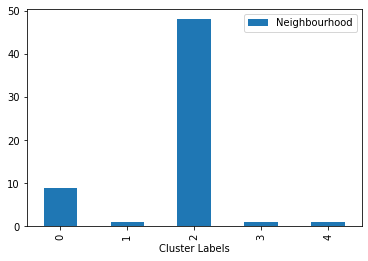

In [119]:
data_plot_1 = london_chinese_resta.drop([london_chinese_resta.columns[1]], axis = 1)
data_plot_1.groupby('Cluster Labels').count().plot.bar()

<AxesSubplot:xlabel='Neighbourhood'>

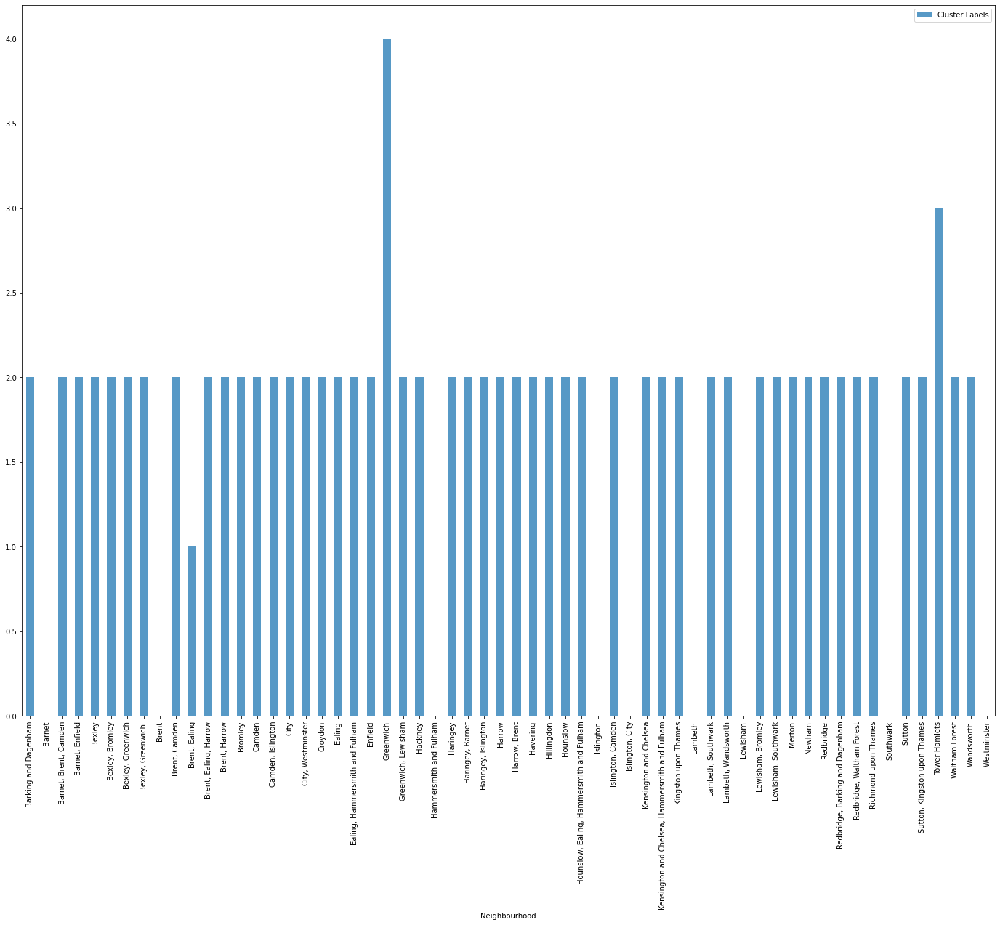

In [120]:

data_plot_1.set_index('Neighbourhood',inplace=True,drop=True)
data_plot_1.plot(kind='bar',figsize=(24,18),alpha=0.75)


In [121]:
data_plot_2 = london_chinese_resta.drop([london_chinese_resta.columns[2]], axis = 1)


<AxesSubplot:xlabel='Neighbourhood'>

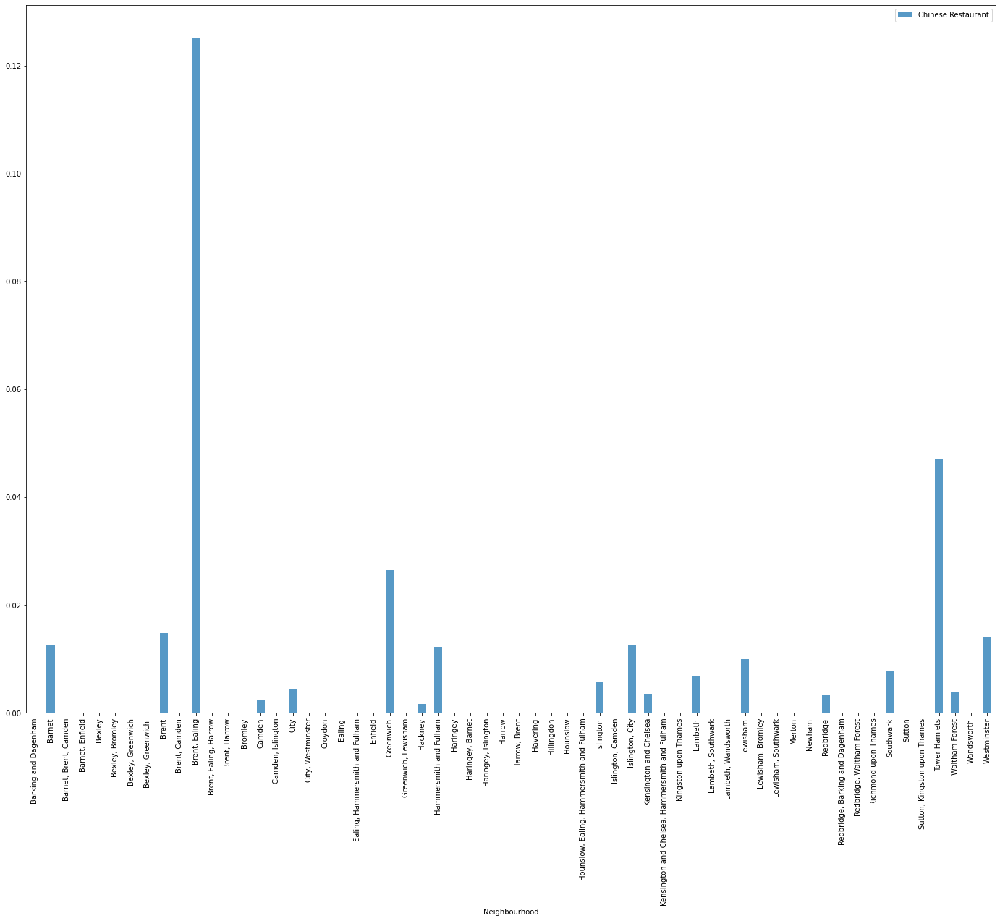

In [122]:
data_plot_2.set_index('Neighbourhood',inplace=True,drop=True)
data_plot_2.plot(kind='bar',figsize=(24,18),alpha=0.75)


In [90]:
london_merged.columns = ['Neighbourhood','Town','Post-code', 'Latitude', 'Longitude']
london_merged

,Neighbourhood,Town,Post-code,Latitude,Longitude
0,"Bexley, Greenwich",LONDON,SE2,51.492450,0.121270
1,"Ealing, Hammersmith and Fulham",LONDON,"W3, W4",51.513240,-0.267460
2,Croydon,CROYDON,CR0,51.384755,-0.051498
3,Croydon,CROYDON,CR0,51.384755,-0.051498
4,Bexley,"BEXLEY, SIDCUP","DA5, DA14",51.506420,-0.127210
...,...,...,...,...,...
526,Greenwich,LONDON,SE18,51.482070,0.071430
527,"Sutton, Kingston upon Thames",WORCESTER PARK,KT4,51.506420,-0.127210
528,Hammersmith and Fulham,LONDON,W12,51.506450,-0.236910
529,Hillingdon,HAYES,UB4,51.506420,-0.127210


In [123]:
final_merged = london_chinese_resta.join(venues_in_london.set_index("Neighbourhood"), on="Neighbourhood")
final_merged

,Neighbourhood,Chinese Restaurant,Cluster Labels,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Category
0,Barking and Dagenham,0.000000,2,51.53312,0.084077,Lidl,Supermarket
0,Barking and Dagenham,0.000000,2,51.53312,0.084077,Tesco Express,Grocery Store
0,Barking and Dagenham,0.000000,2,51.53312,0.084077,Tesco Express,Grocery Store
0,Barking and Dagenham,0.000000,2,51.53312,0.084077,Barking Bathhouse,Spa
0,Barking and Dagenham,0.000000,2,51.53312,0.084077,Greatfields Park,Park
...,...,...,...,...,...,...,...
59,Westminster,0.014013,0,51.49713,-0.138290,The Jugged Hare,Pub
59,Westminster,0.014013,0,51.49713,-0.138290,Laos Cafe,Restaurant
59,Westminster,0.014013,0,51.49713,-0.138290,Subway,Sandwich Place
59,Westminster,0.014013,0,51.49713,-0.138290,Nando's,Portuguese Restaurant


In [124]:
final_merged.sort_values(["Cluster Labels"], inplace=True)
final_merged

,Neighbourhood,Chinese Restaurant,Cluster Labels,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Category
59,Westminster,0.014013,0,51.49713,-0.13829,Loco Mexicano,Mexican Restaurant
35,Islington,0.005764,0,51.56393,-0.12945,Starbucks,Coffee Shop
35,Islington,0.005764,0,51.56393,-0.12945,Costa Coffee,Coffee Shop
35,Islington,0.005764,0,51.56393,-0.12945,ll Mio Mosaic,Italian Restaurant
35,Islington,0.005764,0,51.56393,-0.12945,The Landseer,Pub
...,...,...,...,...,...,...,...
22,Greenwich,0.026490,4,51.48454,0.00275,Star Express,Café
22,Greenwich,0.026490,4,51.48454,0.00275,Gurkha's Inn,Indian Restaurant
22,Greenwich,0.026490,4,51.48454,0.00275,Co-op Food,Grocery Store
22,Greenwich,0.026490,4,51.48454,0.00275,Tyler Street Bus Stop,Bus Stop


In [125]:
map_clusters = folium.Map(location=[london_lat_coords, london_long_coords],zoom_start=10.5)

markers_colors={}
markers_colors[0] = 'red'
markers_colors[1] = 'blue'
markers_colors[2] = 'green'
markers_colors[3] = 'yellow'
markers_colors[4] = 'orange'
markers_colors[5] = 'black'
for lat, lon, cluster in zip(final_merged['Neighbourhood Latitude'], final_merged['Neighbourhood Longitude'], final_merged['Cluster Labels']):
    
    
    folium.features.CircleMarker(
        [lat, lon],
        radius=5,
       
        color =markers_colors[cluster],
        fill_color=markers_colors[5],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters


### Preparing the dataframe in order to plot it

### Plot the clusters

### Cluster 1 (Red)

In [126]:
london_chinese_rest_cluster_0 = final_merged.loc[(final_merged['Cluster Labels'] == 0) & (final_merged['Venue Category'] == 'Chinese Restaurant')]
london_chinese_rest_cluster_0.drop_duplicates()

,Neighbourhood,Chinese Restaurant,Cluster Labels,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Category
35,Islington,0.005764,0,51.52361,-0.09877,New East House,Chinese Restaurant
8,Brent,0.014831,0,51.53938,-0.25205,Good Taste,Chinese Restaurant
53,Southwark,0.007619,0,51.47480,-0.09313,Tasty House,Chinese Restaurant
53,Southwark,0.007619,0,51.47480,-0.09313,Lamoon,Chinese Restaurant
25,Hammersmith and Fulham,0.012195,0,51.53938,-0.25205,Good Taste,Chinese Restaurant
25,Hammersmith and Fulham,0.012195,0,51.47772,-0.20145,Royal China,Chinese Restaurant
44,Lewisham,0.010000,0,51.46268,-0.03558,Bamboo Garden,Chinese Restaurant
25,Hammersmith and Fulham,0.012195,0,51.49617,-0.22935,Steam Restaurant,Chinese Restaurant
41,Lambeth,0.006873,0,51.47480,-0.09313,Lamoon,Chinese Restaurant
41,Lambeth,0.006873,0,51.47480,-0.09313,Tasty House,Chinese Restaurant


### Cluster 2 (Blue)

In [127]:
london_chinese_rest_cluster_1 = final_merged.loc[(final_merged['Cluster Labels'] == 1) & (final_merged['Venue Category'] == 'Chinese Restaurant')]
london_chinese_rest_cluster_1.drop_duplicates()

,Neighbourhood,Chinese Restaurant,Cluster Labels,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Category
10,"Brent, Ealing",0.125,1,51.53938,-0.25205,Good Taste,Chinese Restaurant


### Cluster 3 (Green)

In [128]:
london_chinese_rest_cluster_2 = final_merged.loc[(final_merged['Cluster Labels'] == 2) & (final_merged['Venue Category'] == 'Chinese Restaurant')]
london_chinese_rest_cluster_2.drop_duplicates()

,Neighbourhood,Chinese Restaurant,Cluster Labels,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Category
38,Kensington and Chelsea,0.003527,2,51.48563,-0.18144,"New Culture Revolution, SW3",Chinese Restaurant
57,Waltham Forest,0.003891,2,51.55885,-0.00733,Fortune House Chinese Takeaways,Chinese Restaurant
49,Redbridge,0.003413,2,51.58977,0.03052,Wing Sing,Chinese Restaurant
16,City,0.004255,2,51.51841,-0.08815,Yauatcha,Chinese Restaurant
14,Camden,0.002488,2,51.51651,-0.11968,Canton Element,Chinese Restaurant
14,Camden,0.002488,2,51.51651,-0.11968,Kam Fung,Chinese Restaurant
24,Hackney,0.001667,2,51.55885,-0.00733,Fortune House Chinese Takeaways,Chinese Restaurant


### Cluster 4 (Yellow)

In [129]:
london_chinese_rest_cluster_3 = final_merged.loc[(final_merged['Cluster Labels'] == 3) & (final_merged['Venue Category'] == 'Chinese Restaurant')]
london_chinese_rest_cluster_3.drop_duplicates()

,Neighbourhood,Chinese Restaurant,Cluster Labels,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Category
56,Tower Hamlets,0.046908,3,51.51122,-0.01264,Sichuan Kitchen,Chinese Restaurant
56,Tower Hamlets,0.046908,3,51.52022,-0.05431,Sinh Le,Chinese Restaurant
56,Tower Hamlets,0.046908,3,51.52022,-0.05431,Tian Tian,Chinese Restaurant


### Cluster 5 (Orange)

In [130]:
london_chinese_rest_cluster_4 = final_merged.loc[(final_merged['Cluster Labels'] == 4) & (final_merged['Venue Category'] == 'Chinese Restaurant')]
london_chinese_rest_cluster_4.drop_duplicates()

,Neighbourhood,Chinese Restaurant,Cluster Labels,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Category
22,Greenwich,0.02649,4,51.48747,0.02795,Dragon & Phoenix,Chinese Restaurant
22,Greenwich,0.02649,4,51.48207,0.07143,Capital Noodle Bar,Chinese Restaurant
